First 5 rows of the dataset:
         DATE  FEDFUNDS
0  1954-07-01      0.80
1  1954-08-01      1.22
2  1954-09-01      1.07
3  1954-10-01      0.85
4  1954-11-01      0.83

Missing values in each column:
DATE        0
FEDFUNDS    0
dtype: int64


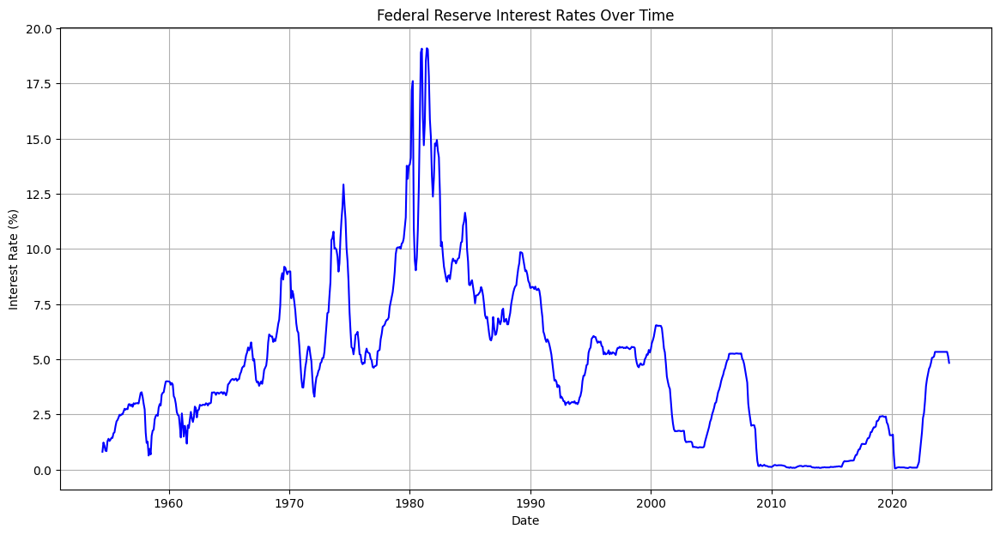


Training samples: 627
Testing samples: 157


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
Step 1: Train Loss = 0.0030, Val Loss = 0.0225
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Step 2: Train Loss = 0.0016, Val Loss = 0.0119
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Step 3: Train Loss = 0.0026, Val Loss = 0.0101
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Step 4: Train Loss = 0.0022, Val Loss = 0.0062
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Step 5: Train Loss = 0.0018, Val Loss = 0.0037
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Step 6: Train Loss = 0.0018, Val Loss = 0.0032
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Step 7: Train Loss = 0.0016, Val Loss = 0.0005
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Step 8: Train Loss = 0.0014, Val Loss = 0.0040
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Step 9: Train Loss = 0.0016, Val Loss = 0.0061
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Step 10: Train Loss = 0.0022, Val Loss = 0.0101
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Step 11: Train Loss = 0.0020, Val Loss = 0.0074
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Step 12: Train Loss = 0.

In [46]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Suppress TensorFlow warnings for cleaner output
import logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# Step 1: Load and Inspect the Data
# Replace 'fed_interest_rates.csv' with your actual CSV file path
df = pd.read_csv('FEDFUNDS.csv')

# Display the first few rows
print("First 5 rows of the dataset:")
print(df.head())

# Check for missing values
print("\nMissing values in each column:")
print(df.isnull().sum())

# Ensure the 'Date' column is in datetime format and sort the data by date

df['DATE'] = pd.to_datetime(df['DATE'])
df = df.sort_values('DATE')

# Reset index after sorting
df.reset_index(drop=True, inplace=True)

# Step 2: Visualize the Data
plt.figure(figsize=(14,7))
sns.lineplot(x='DATE', y='FEDFUNDS', data=df, color='blue')
plt.title('Federal Reserve Interest Rates Over Time')
plt.xlabel('Date')
plt.ylabel('Interest Rate (%)')
plt.grid(True)
plt.show()

# Step 3: Prepare the Data for LSTM
# Select the 'Interest_Rate' column as the feature
data = df[['FEDFUNDS']].values

# Feature Scaling using MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Define the number of time steps (e.g., 60 months)
TIME_STEPS = 60

# Function to create sequences
def create_sequences(data, time_steps):
    X, y = [], []
    for i in range(time_steps, len(data)):
        X.append(data[i-time_steps:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

X, y = create_sequences(scaled_data, TIME_STEPS)

# Reshape X for LSTM [samples, time_steps, features]
X = X.reshape((X.shape[0], X.shape[1], 1))

# Split the data into training and testing sets (80% train, 20% test)
split_ratio = 0.8
split_index = int(X.shape[0] * split_ratio)

X_train, X_test = X[:split_index], X[split_index:]
y_train, y_test = y[:split_index], y[split_index:]

print(f'\nTraining samples: {X_train.shape[0]}')
print(f'Testing samples: {X_test.shape[0]}')

# Step 4: Build the LSTM Model
model = Sequential()

# First LSTM layer with Dropout
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(Dropout(0.2))

# Second LSTM layer with Dropout
model.add(LSTM(units=50, return_sequences=False))
model.add(Dropout(0.2))

# Output layer
model.add(Dense(units=1))

# # Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')


def walk_forward_validation(model, X, y, scaler, initial_train_size, val_size, step_size, epochs=10, batch_size=32):
    """
    Implements walk-forward validation for a TensorFlow model.

    Parameters:
        model: TensorFlow/Keras model
        X: Feature array
        y: Target array
        scaler: MinMaxScaler (for inverse-transforming predictions)
        initial_train_size: Initial size of the training data
        val_size: Number of samples for each validation step
        step_size: Number of samples to slide the window at each step
        epochs: Number of training epochs
        batch_size: Batch size for training

    Returns:
        train_losses: List of training losses for each step
        val_losses: List of validation losses for each step
        predictions: List of predictions on validation sets
    """
    train_losses = []
    val_losses = []
    predictions = []

    start = 0
    while start + initial_train_size + val_size <= len(X):
        # Split the data into training and validation sets
        train_end = start + initial_train_size
        val_end = train_end + val_size

        X_train, y_train = X[start:train_end], y[start:train_end]
        X_val, y_val = X[train_end:val_end], y[train_end:val_end]

        # Train the model on the current training set
        history = model.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            verbose=0
        )

        # Calculate training loss
        train_loss = history.history['loss'][-1]
        train_losses.append(train_loss)

        # Validate the model on the validation set
        val_loss = model.evaluate(X_val, y_val, verbose=0)
        val_losses.append(val_loss)

        # Predict on the validation set
        y_pred = model.predict(X_val)
        y_pred_rescaled = scaler.inverse_transform(y_pred)  # Rescale predictions to original scale
        predictions.append(y_pred_rescaled)

        print(f"Step {start // step_size + 1}: Train Loss = {train_loss:.4f}, Val Loss = {val_loss:.4f}")

        # Slide the window
        start += step_size

    return train_losses, val_losses

# Example Usage
# Assuming model, X, y, and scaler are already defined and preprocessed
# Parameters for walk-forward validation
initial_train_size = 120   # Use 600 months (50 years) of data for initial training
val_size = 6             # Validate on 6 months (1 year) of data
step_size = 6            # Slide the window by 12 months

train_losses, val_losses = walk_forward_validation(
    model=model,
    X=X,
    y=y,
    scaler=scaler,
    initial_train_size=initial_train_size,
    val_size=val_size,
    step_size=step_size,
    epochs=10,
    batch_size=32
)


In [49]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.dates as mdates
import numpy as np
import pandas as pd

def animate_walk_forward_with_years(dates, y, initial_train_size, val_size, step_size):
    """
    Creates an animation to visualize walk-forward validation steps with years on the x-axis.

    Parameters:
        dates: Array of dates corresponding to the time series data
        y: Target array (time series targets)
        initial_train_size: Initial size of the training window
        val_size: Size of the validation window
        step_size: Number of samples to move forward at each step
    """
    start = 0
    steps = []

    # Prepare the steps for animation
    while start + initial_train_size + val_size <= len(y):
        train_end = start + initial_train_size
        val_end = train_end + val_size
        steps.append((start, train_end, val_end))
        start += step_size

    # Initialize the figure
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(dates, y, label="Full Dataset", color="gray", alpha=0.5, linewidth=2)

    train_line, = ax.plot([], [], label="Training Data", color="blue")
    val_line, = ax.plot([], [], label="Validation Data", color="orange", linestyle="-")

    ax.set_title("Walk-Forward Validation")
    ax.set_xlabel("Year")
    ax.set_ylabel("Target Value (Federal Funds Rate)")
    ax.legend(loc="upper left")
    ax.grid(True)

    # Format the x-axis to display years
    ax.xaxis.set_major_locator(mdates.YearLocator(5))  # Major ticks every year
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format as 'YYYY'
    fig.autofmt_xdate()  # Auto-rotate date labels for better readability

    # Update function for the animation
    def update(frame):
        start, train_end, val_end = steps[frame]
        train_line.set_data(dates[start:train_end], y[start:train_end])
        val_line.set_data(dates[train_end:val_end], y[train_end:val_end])
        return train_line, val_line

    # Create the animation
    ani = animation.FuncAnimation(
        fig, update, frames=len(steps), interval=1000, blit=True
    )

    plt.close(fig)  # Prevent the static figure from showing
    return ani

# Example usage
# Assuming your dataset has a 'DATE' column and 'FEDFUNDS' as target
# Replace `dates` and `y` with actual data
data = pd.read_csv("FEDFUNDS.csv")
data['DATE'] = pd.to_datetime(data['DATE'])  # Ensure the dates are in datetime format
dates = data['DATE'].values
y = data['FEDFUNDS'].values

# Parameters for walk-forward validation
initial_train_size = 120   # Use 60 months (5 years) for initial training
val_size = 6             # Validate on 12 months (1 year)
step_size = 6            # Slide the window by 12 months

ani = animate_walk_forward_with_years(dates, y, initial_train_size, val_size, step_size)

# To display the animation in a Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_jshtml())


In [77]:
ani.save("walk_forward_animation.mp4", writer="ffmpeg")

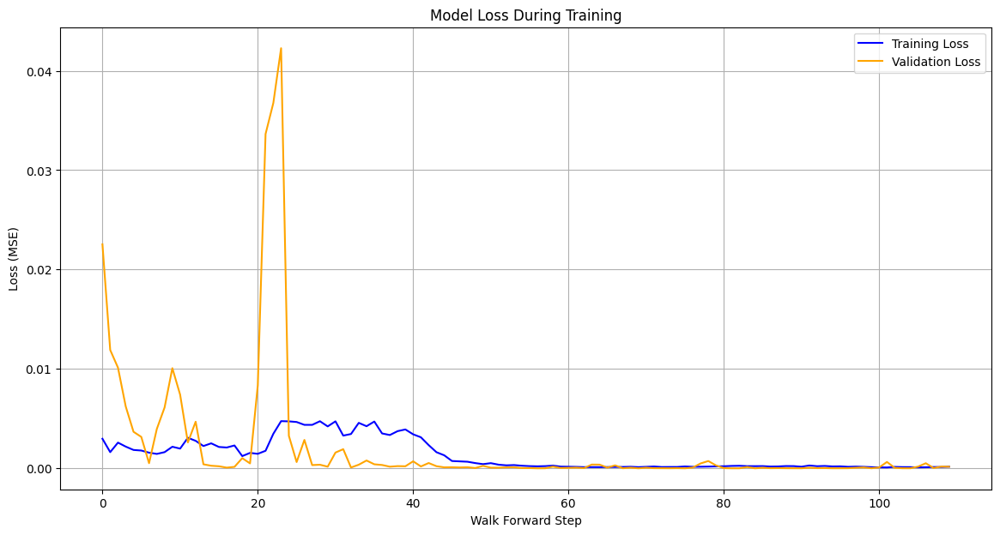

In [47]:
plt.figure(figsize=(14,7))
plt.plot(train_losses, label='Training Loss', color='blue')
plt.plot(val_losses, label='Validation Loss', color='orange')
plt.title('Model Loss During Training')
plt.xlabel('Walk Forward Step')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True)
plt.show()


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

Last date in the dataset: 2024-10-01
Ensure that the dataset includes all months up to December 2024 for accurate prediction.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


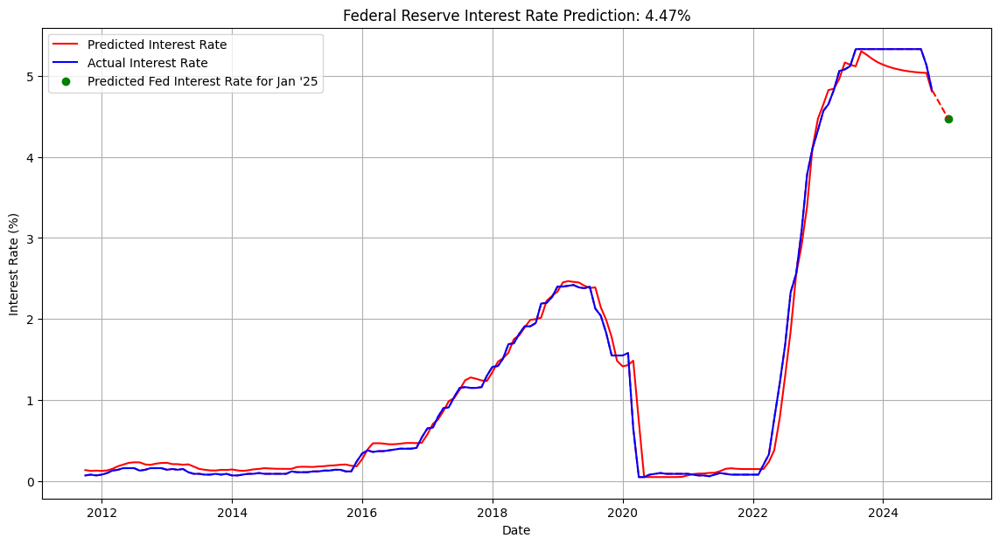

In [76]:
# Step 7: Make Predictions
# Predict on test data
predictions = model.predict(X_test)
predictions = scaler.inverse_transform(np.clip(predictions, 0, 1))  # Reverse scaling
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

last_date = df['DATE'].max()
print(f"\nLast date in the dataset: {last_date.strftime('%Y-%m-%d')}")

# Define the next date (January 2025)
next_date = pd.to_datetime('2025-01-01')

# Check if the next_date is the immediate next month after last_date
expected_next_date = last_date + pd.DateOffset(months=1)
if next_date != expected_next_date:
    print(f"Warning: The next date ({next_date.strftime('%Y-%m-%d')}) is not the immediate next month after the last date in the dataset ({last_date.strftime('%Y-%m-%d')}).")
    print("Ensure that the dataset includes all months up to December 2024 for accurate prediction.")

# Prepare the input for prediction
# Get the last TIME_STEPS data points
last_time_steps = scaled_data[-TIME_STEPS:]

# Reshape to [1, TIME_STEPS, 1]
input_sequence = last_time_steps.reshape((1, TIME_STEPS, 1))

# Predict the next value
predicted_scaled = model.predict(input_sequence)
predicted_interest_rate = scaler.inverse_transform(predicted_scaled)


# Prepare dates for plotting
test_dates = df['DATE'][-len(y_test_actual):].reset_index(drop=True)

# Plot the actual vs predicted interest rates
plt.figure(figsize=(14,7))
ad = test_dates.to_list()
ad.append(next_date)
plt.plot(test_dates, predictions, label='Predicted Interest Rate', color='red')
plt.plot(ad, np.concatenate((y_test_actual, predicted_interest_rate)), color='red', linestyle='--')
plt.plot(test_dates, y_test_actual, label='Actual Interest Rate', color='blue')
plt.scatter(next_date, predicted_interest_rate, color='green', label="Predicted Fed Interest Rate for Jan '25")
plt.title('Federal Reserve Interest Rate Prediction: {0:.2f}'.format(predicted_interest_rate[0][0]) + '%')
plt.xlabel('Date')
plt.ylabel('Interest Rate (%)')
plt.legend()
plt.grid(True)
plt.show()